<a href="https://colab.research.google.com/github/paulxshen/differentiable-fdtd-beta-prerelease/blob/master/%5Binverse_design%5D_waveguide_bend.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Install Julia. Reload page afterwards

In [ ]:
%%shell
set -e

#---------------------------------------------------#
JULIA_VERSION="1.9.4" # any version ≥ 0.7.0
JULIA_PACKAGES="IJulia"
JULIA_PACKAGES_IF_GPU=""
JULIA_NUM_THREADS=4
#---------------------------------------------------#

if [ -z `which julia` ]; then
#if [JULIA_NUM_THREADS=4];then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  # Install Packages
  if [ "$COLAB_GPU" = "1" ]; then
      JULIA_PACKAGES="$JULIA_PACKAGES $JULIA_PACKAGES_IF_GPU"
  fi
  for PKG in `echo $JULIA_PACKAGES`; do
    echo "Installing Julia package $PKG..."
    julia -e 'using Pkg; pkg"add '$PKG'; precompile;"' &> /dev/null
  done

  # Install kernel and rename it to "julia"
  echo "Installing IJulia kernel..."
  julia -e 'using IJulia; IJulia.installkernel("julia", env=Dict(
      "JULIA_NUM_THREADS"=>"'"$JULIA_NUM_THREADS"'"))'
  KERNEL_DIR=`julia -e "using IJulia; print(IJulia.kerneldir())"`
  KERNEL_NAME=`ls -d "$KERNEL_DIR"/julia*`
  mv -f $KERNEL_NAME "$KERNEL_DIR"/julia

  echo ''
  echo "Successfully installed `julia -v`!"
  echo "Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then"
  echo "jump to the 'Checking the Installation' section."
fi

Installing Julia 1.9.4 on the current Colab Runtime...
2023-12-28 19:04:51 URL:https://julialang-s3.julialang.org/bin/linux/x64/1.9/julia-1.9.4-linux-x86_64.tar.gz [146163887/146163887] -> "/tmp/julia.tar.gz" [1]
Installing Julia package IJulia...


In [ ]:
versioninfo()

Julia Version 1.9.4
Commit 8e5136fa297 (2023-11-14 08:46 UTC)
Build Info:
  Official https://julialang.org/ release
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 2 × Intel(R) Xeon(R) CPU @ 2.20GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-14.0.6 (ORCJIT, broadwell)
  Threads: 5 on 2 virtual cores
Environment:
  LD_LIBRARY_PATH = /usr/local/nvidia/lib:/usr/local/nvidia/lib64
  JULIA_NUM_THREADS = 4


In [ ]:
ENV["JULIA_PKG_PRECOMPILE_AUTO"]

"0"

In [ ]:
ENV["JULIA_PKG_PRECOMPILE_AUTO"] = 0
using Pkg
Pkg.add(url="https://github.com/paulxshen/differentiable-fdtd-beta-prerelease/")


In [ ]:
]update

In [ ]:
]add CairoMakie,BSON,UnPack,  Random, StatsBase, ImageTransformations, Interpolations, Flux, Optim, Jello,Functors

LoadError: ignored

In [ ]:
f="https://github.com/paulxshen/differentiable-fdtd-beta-prerelease"
run(`git clone $f`)

In [ ]:
"""
Solves first photonics inverse design problem in Google's Ceviche challenges.
Design is a tight right angle waveguide bend.
"""

########################
# tunable configs #
###################
name = "waveguide_bend"
data_dir = "differentiable-fdtd-beta-prerelease/examples/utils"

"training params"
T = 16.0f0 # simulation duration in [periods]
nbasis = 4 # complexity of design region
trainer = :Optim # :Flux or :Optim
η = 0.2 # training rate (only applies if Flux is trainer)
Courant = 0.5f0 # Courant number
C = 1000 # scale loss

"""
training schedule
    - nres: resolution per wavelength
    - contrast: edge sharpness in design region
    - f_reltol: objective relative tolerance
    - iterations
"""
schedule = [(16, 0.9, 5.0f-3, 50),] #

"recording params"
frameat = 1 / 4 # captures frame every _ periods
framerate = 16 # playback speed
########################

using UnPack,  Random, StatsBase, ImageTransformations, Interpolations, Flux, Optim, Jello
using Flux: withgradient
using Optim: Options, minimizer

using FDTDEngine

include("$data_dir/invrs_load.jl")
include("$data_dir/plot_recipes.jl")

F = Float32
Random.seed!(1)


model = nothing
for (nres, contrast, f_reltol, iterations) in schedule
    # loads Google's Ceviche challenge at specified resolution
    λ = 1.28f0 # wavelength in [microns]
    dx = 1.0f0 / nres # pixel resolution in [wavelengths]
    _dx = λ * dx
    @unpack base, design_start, design_sz, wwg, ports, TE0, wwg, lwg, ld, lp = load(data_dir, "$name.bson", _dx)
    L = size(base) .* dx # domain dimensions [wavelength]
    tspan = (0.0f0, T)


    global model
    if isnothing(model)
        model = Mask(design_sz, nbasis, contrast; diagonal_symmetry=true) # parameterized binary mask for design region
    else
        model = Mask(model; dims=design_sz)
    end

    # setup monitor surfaces
    """
    wwg: waveguide width [wavelengths]
    lwg: waveguide length
    ld: design region length
    lp: edge to port center distance
    """
    r = 3wwg / 2
    monitors = Monitor.([
        [lwg / 2, [lp - r, lp + r]],
        [[lp - r, lp + r], lp/4],
        [lwg, [lwg, lwg + ld]],
        [lwg + ld, [lwg, lwg + ld]],
        [[lwg, lwg + ld], lwg + ld,],
        [[lwg, lp - r], lwg,],
        [[lp + r, lwg + ld], lwg,],
        # [lwg + ld, lwg,lwg+ld,],
    ] ./ λ)

    # loads modal source profile
    x, v = TE0
    x ./= λ
    v /= maximum(v)
    g = linear_interpolation(x, v)
    sources = [Source(t -> cos(F(2π) * t), (x, y) -> g(y), [lwg / 2, lp] / λ, [0, 0.6 / λ]; Jz=1)]


    # setup FDTD
    polarization = :TMz # Ez, Hx, Hy
    boundaries = [] # unspecified boundaries default to PML
    global fdtd_configs = setup(boundaries, sources, monitors, L, dx, polarization; F, Courant, T)
    @unpack Ie, Ih, dx, esz0, hsz0, esz, hsz, dt, geometry_padding, field_padding, source_effects, monitor_instances, fields = fdtd_configs

    μ = apply(geometry_padding[:μ], ones(F, hsz0))
    σ = apply(geometry_padding[:σ], zeros(F, esz0))
    σm = apply(geometry_padding[:σm], zeros(F, hsz0))

    # esz, hsz: full field size including PML padding

    # setup design region to be optimized
    model0 = deepcopy(model)
    ϵ1 = 2.25f0 # oxide
    ϵ2 = 12.25f0 # silicon
    static_geometry = (; base, start=design_start, ϵ1, ϵ2, μ, σ, σm)

    "places design region onto base geometry"
    function make_geometry(design, static_geometry, geometry_padding)
        @unpack start, μ, σ, σm, ϵ1, ϵ2, base = static_geometry
        b = place(base, design, start)
        ϵ = ϵ2 * b + ϵ1 * (1 .- b)
        ϵ = apply(geometry_padding[:ϵ], ϵ)
        p = [ϵ, μ, σ, σm]
    end

    # pre/post-optimization simulation
    function sim(u0, p, fdtd_configs)
        @unpack dt, T = fdtd_configs
        u = u0
        [u = stepTMz(u, p, t, fdtd_configs) for t = 0:dt:T]
    end

    """
    Objective is to maximize outgoing power at port 2 and minimize power leaked elsewhere  during last period
    The latter auxiliary objectives reduce local minima
    """
    function loss(u0, design, static_geometry, fdtd_configs,)
        @unpack dx, dt, T, monitor_instances = fdtd_configs
        u = u0
        p = make_geometry(design, static_geometry, fdtd_configs.geometry_padding)

        # run first T - 1 periods
        for t = 0:dt:T-1
            u = stepTMz(u, p, t, fdtd_configs)
        end
        reduce(((u, l), t) -> (stepTMz(u, p, t, fdtd_configs), begin
                for i = 3:7
                    Ez, Hx, Hy = getindex.(u, Ref.(monitor_instances[i].idxs)...)
                    l +=
                        if i == 2
                            sum(Ez .* Hx + 0 * Hy) # must include all fields otherwise Zygote fails
                        elseif i == 3
                            sum(Ez .* Hy + 0 * Hx)
                        elseif i == 4
                            -sum(Ez .* Hy + 0 * Hx)
                        elseif i == 5
                            sum(Ez .* Hx + 0 * Hy)
                        elseif i == 6 || i == 7
                            -sum(Ez .* Hx + 0 * Hy)
                        end
                end
                l
            end),
            T-1+dt:dt:T, init=(u, 0.0f0))[2] * dx
    end


    # pre-optimization simulation
    u0 = collect(values(fields))
    p0 = make_geometry(model0(), static_geometry, fdtd_configs.geometry_padding)
    @showtime global sol0 = sim(u0, p0, fdtd_configs)
    global mov0=recordsim(sol0, p0, fdtd_configs, "$name-pre_$nres.gif", title="start of training"; frameat, framerate)

    if trainer == :Flux
        "Flux.jl train"
        opt = Adam(η)
        opt_state = Flux.setup(opt, model)
        for i = 1:iterations
            @time begin
                l, (dldm,) = withgradient(model -> C * loss(u0, model(), static_geometry, fdtd_configs), model)
                # l, dldm = withgradient(() -> loss(u0, model(), static_geometry, fdtd_configs), params(model),)
                Flux.update!(opt_state, model, dldm)
                println("$i $l")
            end
        end
    else
        "Optim.jl train"
        x0, re = destructure(model)
        _loss = m -> C * loss(u0, m(), static_geometry, fdtd_configs)
        f, g!, fg! = optimfuncs(_loss, re)
        od = OnceDifferentiable(f, g!, fg!, x0)
        @showtime res = optimize(od, x0, LBFGS(), Optim.Options(; f_reltol, g_tol=0, iterations, show_every=1, show_trace=true))
        model = re(minimizer(res))
    end

    # post-optimization simulation
    if iterations > 0
        p = make_geometry(model(), static_geometry, fdtd_configs.geometry_padding)
        @showtime global sol = sim(u0, p, fdtd_configs)

        # save movies of simulation
      global mov=  recordsim(sol, p, fdtd_configs, "$name-post_$nres.gif", title="after some training"; frameat, framerate)
    end
end

display(mov0)
display(mov)

# plotmonitors(sol0, monitor_instances,)


┌ Warning: Duplicated knots were deduplicated. Use Interpolations.deduplicate_knots!(knots) explicitly to avoid this warning.
│   k1 =
│    504-element view(::Matrix{Float32}, :, 1) with eltype Float32:
│     -0.625
│     -0.6225
│     -0.62
│     -0.6175
│     -0.615
│      ⋮
│      0.61625004
│      0.61875004
│      0.62125003
│      0.62375003
│      0.625
└ @ Interpolations ~/.julia/packages/Interpolations/nDwIa/src/gridded/gridded.jl:77


global sol0 = sim(u0, p0, fdtd_configs): 0.699252 seconds (345.36 k allocations: 450.297 MiB, 32.97% gc time, 23.47% compilation time)
saved simulation recording to waveguide_bend-pre_16.gif
Iter     Function value   Gradient norm 
     0    -5.061681e-01     3.779732e-01
 * time: 0.00023412704467773438
     1    -6.187615e-01     4.251133e-01
 * time: 21.175356149673462
     2    -6.976769e-01     1.596251e-01
 * time: 39.913954973220825
     3    -7.171398e-01     1.971015e-01
 * time: 66.61341309547424
     4    -7.414441e-01     1.247443e-01
 * time: 95.34659910202026
     5    -7.656417e-01     1.566461e-01
 * time: 122.7325370311737
     6    -7.799225e-01     4.165472e-02
 * time: 149.68428802490234
     7    -7.897417e-01     1.245000e-01
 * time: 178.0272719860077
     8    -8.108146e-01     1.613466e-01
 * time: 204.8294861316681
     9    -8.275268e-01     1.900188e-01
 * time: 231.34546208381653
    10    -8.593219e-01     1.590405e-01
 * time: 248.56490802764893
    11    

nothing

nothing

In [ ]:
exit()

Switch to Python to display the saved movies. Reload page after changing runtime

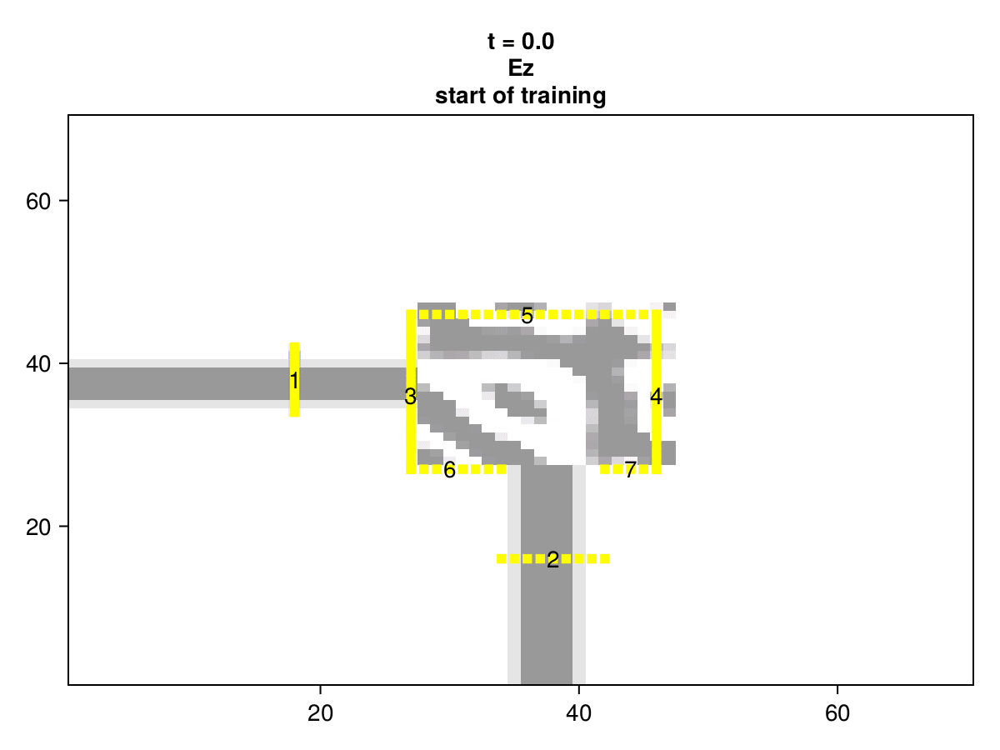

In [ ]:
from IPython.display import Image

#Image(url='...')  # external
fname = '/content/waveguide_bend-pre_16.gif'
Image(open(fname, 'rb').read())  # local

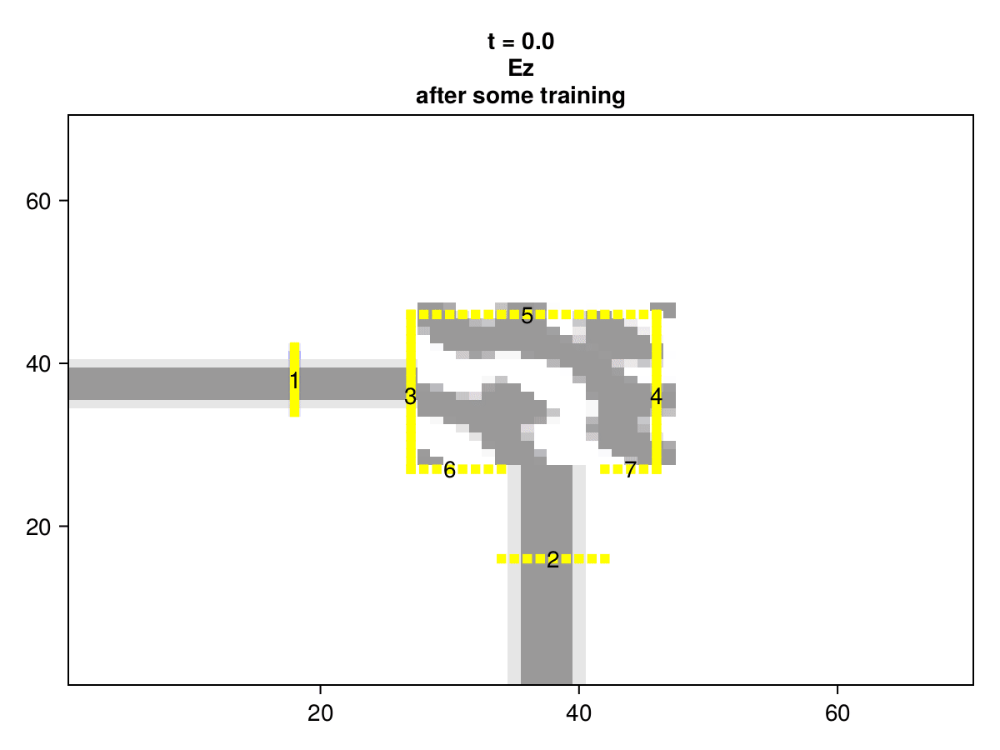

In [ ]:

fname = '/content/waveguide_bend-post_16.gif'
Image(open(fname, 'rb').read())  # local